In [1]:
import sys
sys.path.append('../lib')
from table_detection import Pipeline, TableMask, Table,process_column_mask, process_line_mask, LineDetection
from openfoodfacts import OFFImage, Word
from tablenet import TableNet
from utils import *
import cv2
import os
import numpy as np
import tqdm
import json
import pandas as pd
from IPython.display import display
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 150)
pd.options.display.max_colwidth = 500

In [2]:
%load_ext autoreload
%autoreload 2

In [9]:
import pandas as pd
import os
import sys
sys.path.append('../lib')
from utils import *
from IPython.display import display
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 150)
pd.options.display.max_colwidth = 500

In [17]:
#CHANGER PATH VERS DUMP
base_path = 'C:\\Users\\sadok.guermazi\\Documents\\Projects\\Open Food Facts' 
df = pd.read_csv(os.path.join(base_path,'dump.csv'),encoding='UTF-8')

## Problème de conversion JSON

In [10]:
convert_to_dict(df.iloc[0].data)

JSONDecodeError: Expecting ',' delimiter: line 1 column 779 (char 778)

# Import Modèle

In [4]:
model = TableNet.build()
latest = tf.train.latest_checkpoint(os.path.join(base_path,'notebooks/models/2020_09_24'))
model.load_weights(latest)

# Pipeline

In [5]:
def predict(image_url,table_bbx):
    
    off_image = OFFImage(image_url, table_bbx = table_bbx)
    off_image.get_image()
    off_image.get_ocr()
    off_image.find_words_included_in_nutrition_table()
    off_image.find_words_relative_coordinates()
    off_image.rotate()

    pipeline = Pipeline(model,off_image.corrected_image)
    pipeline.run(0.8,loop_until_converge=False)
    table = Table(pipeline.predicted_column_mask,pipeline.predicted_line_mask,off_image.corrected_image.shape)
    table.find_table()
    extracted_table = table.get_table_from_text_bounding_boxes(off_image.ocr)

    return  off_image, pd.DataFrame(extracted_table).applymap(lambda x: ' '.join(x)).T.to_dict()

26it [00:00, 7139.71it/s]


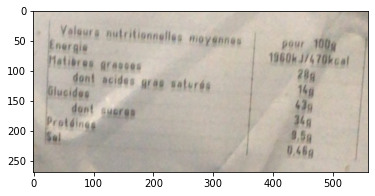

,0,1,2
0,Valsurs Energie Matibres dont Glucides,nutritionnelles moyennes grases acides gras saturés,pour 100g 1960k J/470kcal 28g 14g 439
1,dont Protdings Sel,sueres,"349 9,5g 0.46g"


33it [00:00, 6575.71it/s]


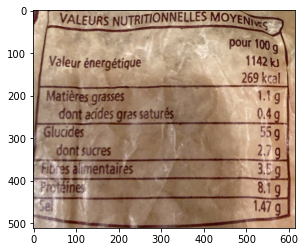

,0,1,2
0,VALEURS,NUTRITIONNELLES,
1,Valeur,énergétique,pour 100 g 1142 kJ 269 kcal
2,Matières dont,grasses acides gras,1.1g 0.4g saturés
3,Glucides dont,sucres,55 g 2.7g
4,Fibres,alimentaires,3.5g
5,Protéines,,8.19
6,Sel,,1.47 g


36it [00:00, 4511.49it/s]


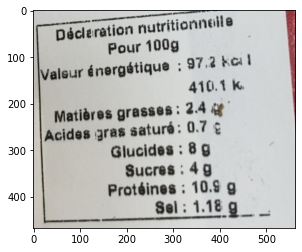

,0,1
0,Décleration,nutritionneile
1,Pour 100g Valsur énergétique :,97.2 kc l
2,Matières grasses:,410.1 k. 2.4
3,Acides gras saturé:,0.7 g
4,Glucides : Sucres :,8 g 4 g
5,Protéines :,10.9 g
6,Sel:,1.18 g


An error has occured


24it [00:00, 6186.29it/s]


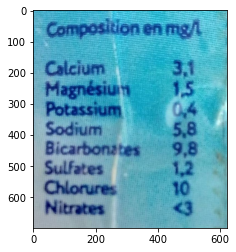

,0,1
0,Composition,en mg/
1,Calcium,"3,1"
2,Magnésium Potassium,"1,5 0,4"
3,Sodium Bicarbonates,"9,8 5,8"
4,Sulfates Chlorures Nitrates,"1,2 10 <3"


114it [00:00, 19041.48it/s]


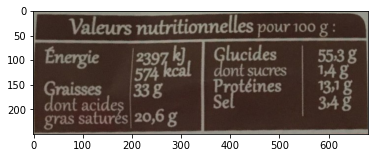

,0,1,2
0,Valeurs nutritionnelles,pour,100 g:
1,"Energie 2397 kJ,",Glucides,55.3g
2,574 kcal,dont sucres,"1,4g"
3,"33 g Graisses dont acides gras satures 20,6 g",Protéines Sel,"13,1 g 34g"


An error has occured


61it [00:00, 5746.27it/s]


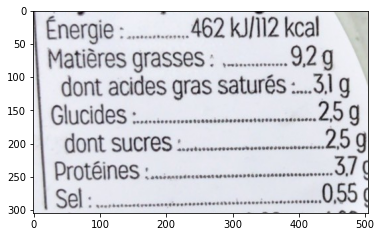

,0,1
0,Énergie,:.. .462 kJ/112 kcal
1,Matières,"9,2 g grasses: . .........."
2,dont acides,gras saturés .31 g
3,Glucides .,.25g
4,dont sucres:,25g
5,Protéines:.,"3,7"
6,| Sel :..,"„0,55"


36it [00:00, 9011.40it/s]


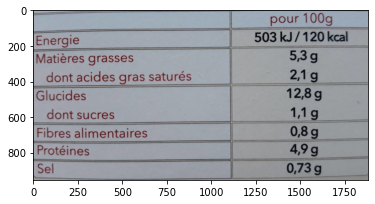

,0,1
0,,pour 100g
1,Energie,503 kJ/120 kcal
2,Matières grasses dont acides gras saturés,"5,3 g 2,1 g"
3,Glucides dont sucres,"12,8 g 1,1 g"
4,Fibres alimentaires,"0,8 g"
5,Protéines,"4,9 g"
6,Sel,"0,73 g"


58it [00:00, 3398.19it/s]


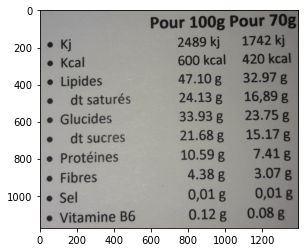

,0,1,2
0,,Pour 100g,Pour 70g
1,Kj,2489 kj,1742 kj
2,Kcal,600 kcal,420 kcal
3,Lipides dt,47.10 g 24.13 g saturés,"32.97 g 16,89 g"
4,Glucides dt,33.93 g 21.68 g sucres,23.75 g 15.17 g
5,Protéines,10.59 g,7.41 g
6,Fibres Sel Vitamine,"4.38 g 0,01 g 0.12 g B6","3.07 g 0,01 g 0.08 g"


37it [00:00, 12258.23it/s]


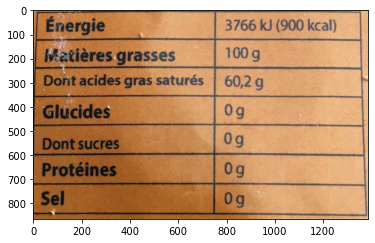

,0,1
0,Énergie,3766 kJ (900 kcal)
1,Matières grasses,100g
2,Dont acides gras saturés,"60,2 g"
3,Glucides,0g
4,Dont sucres,0g
5,Protéines,0g
6,Sel,0g


31it [00:00, 5267.73it/s]


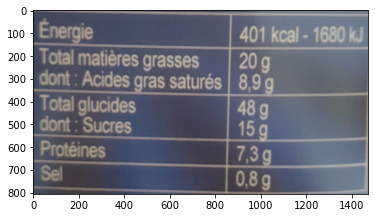

,0,1,2
0,Énergie,,401 kcal - 1680 kJ
1,Total matières dont : Acides,grasses gras saturés,"20g 8,9 g"
2,Total glucides dont: Sucres,,48g 15g
3,Protéines,,"7,3g"
4,Sel,,"0,8g"


An error has occured


102it [00:00, 5685.91it/s]


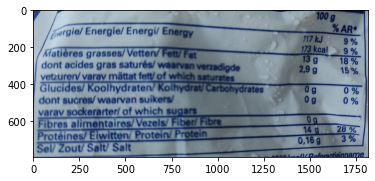

,0,1,2
0,Energiel Energiel Energi/,Energy,100 g % AR* 117 kJ 173 kcal 9 % 9 %
1,Matières grasses/Vetten/ dont acides gras saturés/ vetzuren/ varav mättat fett/,Fett/ Fat waarvan verzadigde of which saturates,"13 g 2,9 g 18 % 15%,"
2,Glucides/ Koolhydraten/ dont sucres/waarvan varav sockerarter/ of which,Kolhydrat/ Carbohydrates suikers/ sugars,0% 0 % 0 g 0g
3,Fibres alimentaires/Vezels/ Proteines/Eiwitten/ Protein/ Sel/ Zout/ Salt/ Salt,Fiber/ Fibre Protein,"14 g 0,16 g 28 % 3%"


52it [00:00, 5536.47it/s]


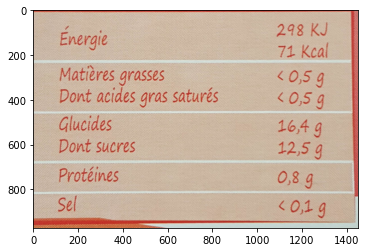

,0,1
0,Energie,298 KJ 71 Kcal
1,Matières grasses Dont acides gras,"saturés 0,5 g 0,5 g"
2,Glucides Dont sucres,"16,4 9 12,5 g"
3,Protéines,"0,89"
4,Sel,"0,1 g"


33it [00:00, 2998.53it/s]


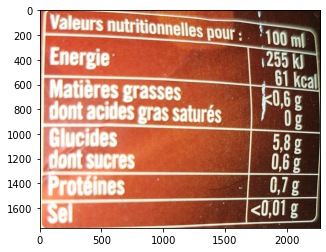

,0,1,2
0,Valeurs Energie,nutritionnelles pour :,100 ml 255 kJ 61 kcal
1,Matières,grasses,"K0,6 g"
2,dont,acides gras saturés,Og
3,Glucides dont,sucres,"5,8 g 0,6 g"
4,Proteines,,"0,7 g"
5,Sel,,"<0,01 g"


24it [00:00, 3138.08it/s]


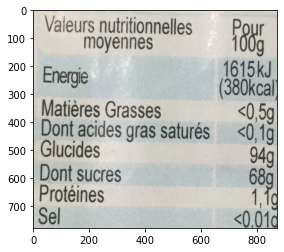

,0,1,2
0,Valeurs,nutritionnelles moyennes,Pour 100g
1,Energie,,1615kJ (380kcal)
2,Matières,Grasses,"<0,5g"
3,Dont acides,gras saturés,"<0,1g"
4,Glucides Dont sucres,,949 68g
5,Proteines,,"1,1g <0,01"


118it [00:00, 6852.77it/s]


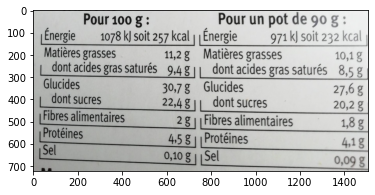

,0,1
0,Pour 100 g: Energie 1078 kJ soit 257 kcal|,Pour un pot de 90 g: 971 kJ soit 232 kcal Énergie
1,"Matières grasses 11,2 g","Matières grasses 10,1 g"
2,"|dont acides gras saturés 9,4g||","dont acides gras saturés 8,5 g"
3,"Glucides dont sucres 30,7 g 22,4 g ||","Glucides 27,6 g dont sucres 20,2 g"
4,Fibres alimentaires,"2g1|Fibres alimentaires 1,8 g"
5,4.5 g|| Protéines,"Protéines 4,1g"
6,"0,10 g| Sel","| Sel 0,09 g"


107it [00:00, 7587.33it/s]


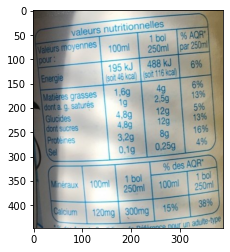

,0,1,2,3,4
0,,valeurs,nutritionnelles,,
1,Valeurs pour:,moyennes,100ml,1 bol 250ml,% AQR par 250ml
2,Energie,,(soit 46 kcal) 195 kJ,488 kJ (soit 116 kcal),6%
3,Matières dont ag. Glucides dont sucres Proteines Sel,grasses saturés,"1,6g 1g 4,8g 4,8g 3,2g 0,1g","4g 2,5g 12g 12g 8g 0,25g",6% 13% 5% 13% 16% 4%
4,Minéraux,100ml,1 bol 250ml,% des 100ml,AQR 1 bol 250ml
5,Calcium,120mg,300mg Référence,15% pour un,38% adulte-type


64it [00:00, 6420.36it/s]


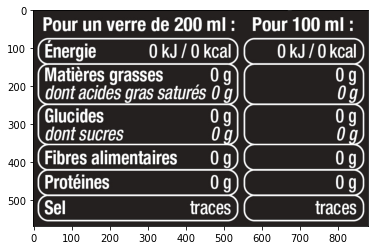

,0,1
0,Pour un verre de 200 ml 0 kJ 0 kcal Energie,Pour 100 ml 0 kJ/O kcal
1,0g dont acides gras saturés 0 g) Matières grasses,0g O g
2,0 g Glucides dont sucres,0 g 0 g
3,Fibres alimentaires O g,O g
4,Protéines 0 g,0g
5,(Sel traces,traces


An error has occured
An error has occured


31it [00:00, 3007.09it/s]


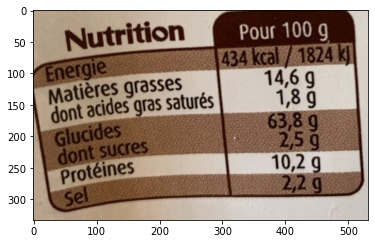

,0,1,2,3
0,Nutrition,,Pour 100,g
1,Energie,,434 kcal/1824,k]
2,Matières dont acides,grasses gras saturés,"14,6 g 1,8 9",
3,Glucides dont sucres,,"63,8 g 2,5 g",
4,Protéines,,"10,2 g",
5,Sel,,"2,2 g",


30it [00:00, 7475.59it/s]


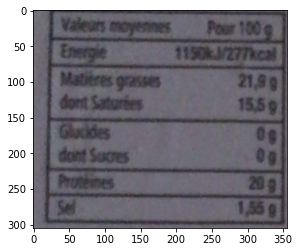

,0,1
0,Valeurs moyennes,Pour 100 g
1,Energie,1150KJ/277kcal
2,EMatieres grasses dont Saturées,"21,9 9 15,5 g"
3,Gucdes dont Sucres,0g 0g
4,Proteines,209
5,Sel,"1,55g"


76it [00:00, 7619.81it/s]


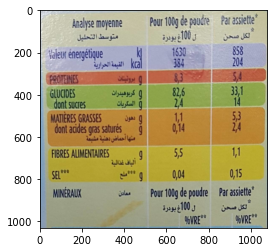

,0,1,2
0,Analyse moyenne متوسط التحليل,Pour 100g de poudre فى 100غ بودرة,Par assiette لكل صحن
1,ki Haleur energétique القيمة الحرارية Kca,1630 384,858 204
2,PROTEINES GLUCIDES dont sucres و برونينان و كربوهيدرات فو السكريات,"8,3 82,6 2,4","S.4 33,1 14"
3,MATIERES GRASSES dont acides gras saturés منها أحماض دهنية مشبعة,"1,1 0,14","2,4"
4,FIBRES ALIMENTAIRES SEL,"5,5 0,04","1,1 0,15"
5,MINERAUX ule,Pour 100g de poudre,Par assiette
6,,اں 100غ بودرة 96VRE,لكل صحن 9%VRE


44it [00:00, 2962.27it/s]


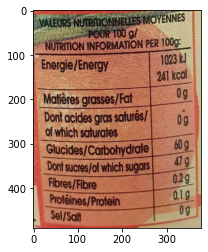

,0,1,2
0,VALEURS,NUTRITIONNELLES,MOYENNES
1,NUTRITION,POUR 100 g/ INFORMATION,PER 100g:
2,Energie/Energy,,1023 kJ 241 kcal
3,Matières,grasses/Fat,0g
4,Dont acides of which,gras saturés/ saturates,0g
5,,Glucides/Carbohydrate,60 g
6,Dont sucres/of,which sugars,47g
7,Fibres/Fibre,,0.2g
8,Sel/Saft,Protéines/Protein,0.1 g 0g


An error has occured
An error has occured


37it [00:00, 4146.45it/s]


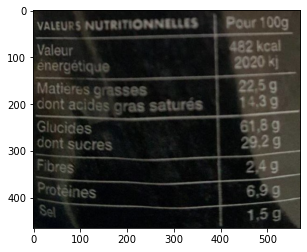

,0,1
0,VALEURS NUTRITIONNELLES,Pour 100g
1,Valeur energétique,482 kcal 2020 kj
2,Matieres grasses dont acides gras saturés,"22,5 g 14.3 g"
3,Glucides dont sucres,"61,8 g 29.2 g"
4,Fibres,"2,4 g"
5,Proteines Sel,"6,9 g 1,5 g"


88it [00:00, 5866.81it/s]


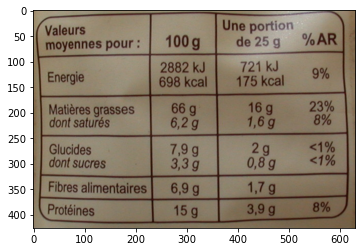

,0,1,2
0,Valeurs moyennes pour:,100 g,Une portion %AR de 25 g
1,Energie,2882 kJ 698 kcal,9% 721 kJ 175 kcal
2,Matières grasses dont saturés,"66 g 6,2 g","23% 16 g 1,6 g 8%"
3,Glucides dont sucres,"7,9 g 3,3 g","2 g <1% <1% 0,8 g"
4,Fibres alimentaires,"6,9 g","1,7 g"
5,Protéines,15 g,"3,9 g 8%"


An error has occured
An error has occured
An error has occured


32it [00:00, 4652.74it/s]


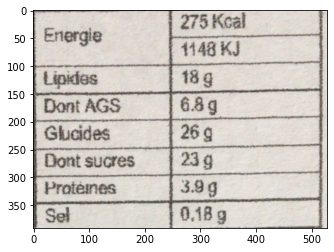

,0,1
0,Energie,275 Kcal 1148 KJ
1,Lipides,18 g
2,Dont AGS,6.8 g
3,Glucides,26 g
4,Dont sucres,23 g
5,Proténes,3.9 g
6,Sel,0.18 g


28it [00:00, 7019.34it/s]


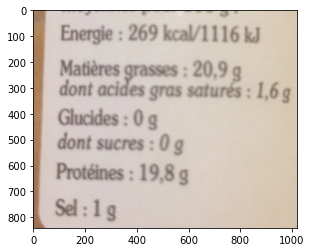

,0,1,2,3
0,,Energie: 269,kcal/1116 k,
1,dont,Matières acides,"grasses: 20,9g gras saturés:","1,6g"
2,,Glucides:0g,,
3,dont,sucres:0,g,
4,,Protéines:,"19,8 g",
5,Sel,: 1 g,,


73it [00:00, 9148.84it/s]


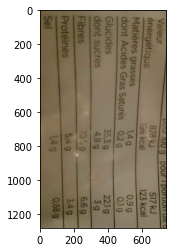

,0,1,2
0,"portion de Valeur Matières dont dont Fibres 517 kJ 123 kcal 0,9 g 0,1 g 22,1 g 3 g 6,6 g 3,4 g 0,88 9 Sel",,pour 100 g pour 1
1,énergétique grasses,,828 kJ 196 kcal
2,Acides Gras Glucides,Saturés,"1,4 g 0,2 g"
3,sucres,,"35,3 g 4,8 g"
4,Protéines,,"10,5 g 5,4 g"
5,,,"1,4 g"


35it [00:00, 2184.89it/s]


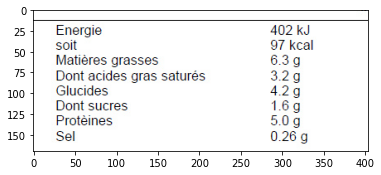

,0,1,2
0,Energie,402 kJ,
1,soit Matières grasses,97 kcal 6.3 g,
2,Dont acides gras,saturés 3.2 g,
3,Glucides,4.2 g,
4,Dont sucres Protèines Sel,1.6 g 5.0 g 0.26 g,


73it [00:00, 5236.42it/s]


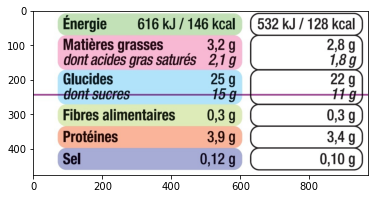

,0,1,2
0,Énergie,616 kJ / 146 kcal,532 kJ / 128 kcal
1,Matières dont acides,"grasses 3,2 g gras saturés 2,1 g","2,8 g 1,8 g"
2,Glucides,25 g 15g,22 g 11g
3,dont sucres Fibres Protéines Sel,"0,3 g alimentaires 3,9 g 0,12 g","0,3 g 3,4 g 0,10 g"


31it [00:00, 3885.70it/s]


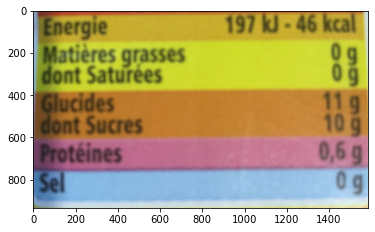

,0,1,2
0,Energie,,197 kJ - 46 kcal
1,Matières dont,grasses Satures,0 g 09 11
2,Glucides dont,Sucres,g 10 g
3,Protéines Sel,,"0,6g 0g"


An error has occured


37it [00:00, 2155.62it/s]


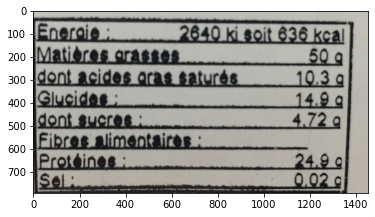

,0,1
0,Eneraie,2640 ki soit 636 kcal
1,Matiores,arasses 50 g
2,dont acides,aras saturés 10.3 g
3,Glucidas dont sucras,14.9 q 4.72 a
4,Fibres alimentaires,
5,Prottines,24.9 q
6,Seli,9.02 g


75it [00:00, 8329.97it/s]


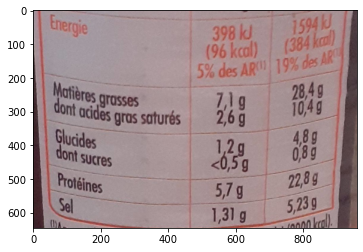

,0,1,2
0,Energie,(96 kcal) 5% des AR 398 kJ,1594 kJ (384 k) 19% des AR
1,Matières grasses dont acides gras satures,"7,1 g 2,6g","28,4 g 10.4g"
2,Glucides dont sucres,"1,2g <0,5g","4,8 g 0,8g"
3,Proféines Sel,"5,7 g 1,31 g","22,8g 5,23 g kcal)."


An error has occured


32it [00:00, 8033.62it/s]


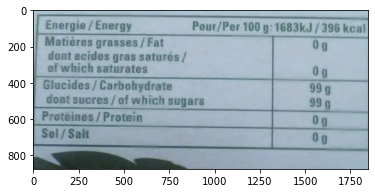

,0,1
0,Pour/Per 100 Energie/Energy,g:1683kJ/396 kcal
1,Matières grasses/Fat dont acides gras saturés/ of which saturates,0 g 0g
2,Glucides/ Carbohydrate dont sucres/ of which sugars,99 g 99 g
3,Protéines/Protein,0g
4,Sel/Salt,0g


31it [00:00, 4440.24it/s]


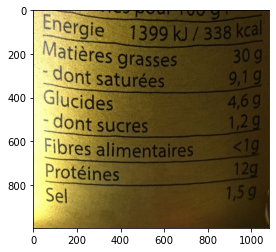

,0,1
0,,100 g Energie 1399 kJ/338 kcal
1,,"Matières grasses dont saturées 30 g 9,19"
2,,"Glucides -dont sucres 4,6 g 1,2 g"
3,Fibres,alimentaires <19
4,,Protéines 12g
5,Sel,"1,5g"


An error has occured
An error has occured


48it [00:00, 10036.72it/s]


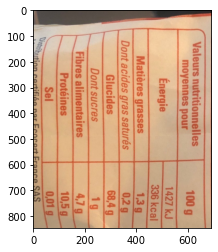

,0,1,2
0,Valeurs g kJ,nutritionnelles moyennes pour,100
1,,Énergie,1427 336 kcal
2,Matières,grasses,"1,3 g"
3,Dont acides,gras saturés,"0,2 g"
4,Dont Fibres,Glucides sucres alimentaires,"68,4 g 1g 4,7 g"
5,Distribution,certifiée Ecocert Protéines Sel,"10,5 g 0,01 g SAS"


45it [00:00, 5636.16it/s]


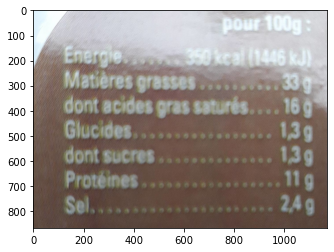

,0,1
0,Energie,pour 100g 350 keal 1446 kJ)
1,Matières,grasses 33 9
2,dont acides,gras saturés.... 16
3,Glucides dont sucres..o*,"1,39 1,39 *********** ee e"
4,Proteines.**.**. Sel....,. 11 g .24g


148it [00:00, 5588.13it/s]


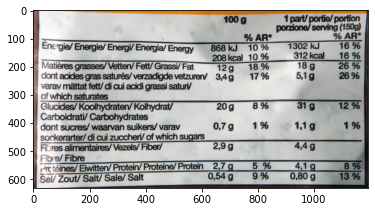

,0,1,2
0,,100 g % AR*,1 part/ portie/ portion porzione/ serving (150g) % AR*
1,Énergie/ Energie/ Energi/ Energia/,Energy 868 kJ 10 % 208 kcal 10 %,16 % 16 % 1302 kJ 312 kcal
2,Matières grasses/Vetten/ Fett/ dont acides gras saturés/verzadigde varav mättat fett/di cui acidi grassi of which saturates,"12g Grassi/ Fat vetzuren 3,4g saturi 18 % 17 %","26 % 26 % 18 g 5,1 g"
3,Glucides/ Koolhydraten/ Kolhydrat/,20 g 8 %,31 g 12 %
4,Carboidrati/ Carbohydrates dont sucres/ waarvan suikers/ sockerarter/ di cui zuccheri/ of,"varav which sugars 0,7 g 1%","1,1 g 1%"
5,Fibres alimentaires/Vezels/ Fiber/ Fibre/ Fibre Pretéines/Eiwitten/Protein/Proteine/Protein Sel/ Zout/ Salt/ Sale/ Salt,"2,7 g 2,9 g 5 % 9 % 0,54 g","4,4 g 4,1 g 0,80 g 8% 13 %"


50it [00:00, 10115.53it/s]


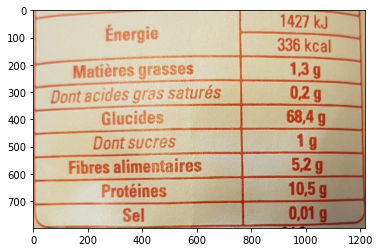

,0,1
0,Énergie,1427 kJ 336 kcal
1,Matières grasses,"1,3 g"
2,Dont acides gras saturés,"0,2 g"
3,Glucides,"68,4 g"
4,Dont sucres,1g
5,Fibres alimentaires,"5,2g"
6,Protéines,"10,5 g"
7,Sel,"0,01 g"


30it [00:00, 4350.94it/s]


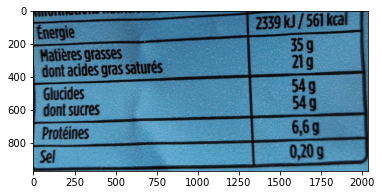

,0,1
0,Energie,2339 kJ/561 kcal
1,Matières grasses dont acides gras saturés,35 g 21 g
2,Glucides dont sucres,54 g 54g
3,Protéines,"6,6g"
4,Sel,"0,20g"


An error has occured
An error has occured


39it [00:00, 4304.00it/s]


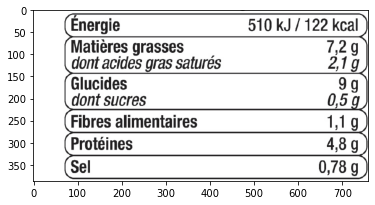

,0,1,2
0,(Énergie,510 kJ,122 kcal
1,Matières dont acides,grasses gras saturés,"7,2 g 2,1 g"
2,Glucides dont sucres,,"9 g 0,5 g"
3,Fibres,alimentaires,"1,1 g"
4,Protéines,,"4,8 g"
5,(Sel,,"0,78 g"


26it [00:00, 10731.34it/s]


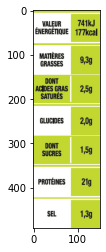

,0,1,2
0,ÉNERGETIQUE VALEUR,,741KJ 177kcal
1,MATIERES GRASSES,,"9,3g"
2,DONT ACIDES GRAS SATURES,,"2,5g"
3,GLUCIDES,,"2,0g"
4,DONT SUCRES,,"1,5g"
5,PROTEINES SEL,,"21g 1,3g"


91it [00:00, 6589.81it/s]


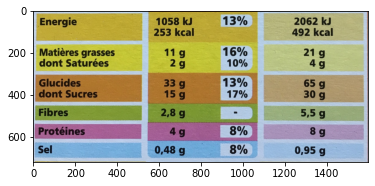

,0,1,2,3
0,Energie,1058 kJ 253 kcal,13%,2062 kJ 492 kcal
1,Matières grasses dont Saturées,11 g 2 g,16% 10%,21 g 4 g
2,Glucides dont Sucres,33 g 15 g,13% 17%,65 g 30 g
3,Fibres,"2,8 g",,"5,5 g"
4,Protéines,4 g,8%,8 g
5,Sel,"0,48 g",8%,"0,95 g"


124it [00:00, 10143.22it/s]


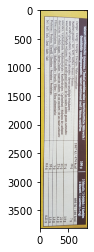

,0,1,2,3
0,3 biscuits/3 Gebãch/3 Koekjes 3 Biscotti / 3 Galettas (-35g) 100 g Valeurs nutritionnelles moyennes/Typical nutrition Gemiddelde voedingswaarden/Valori kJ / 474 kcal 20 g 695 kJ/166 kcal 7 9 Energie/Energy/Energie/Energia/Valor energético: Matières grasses/Fat/ Fett/Vetten / Grassi / Grasas: dont acides gras saturés/of which saturates/ davon waarvan verzadigde vetzuren / di cui acidi grassi saturi/de Glucides/Carbohydrate / Kohlenhydrate/ Koolhydraten / dont sucres/of whiích sugars/ davon Žu...,,,
1,value/Durchschnittliche nutrizionali,medi/Valores,nutritivos,Nãhrwerte/ 1987
2,gesättigte Fettsäuren las cuales Carboidrati/ suikers/di cui zuccheri Fibra alimentaria: Proteíinas:,/ ácidos Hidratos /de las,grasos de cuales,saturados: carbono: azúcares:
3,,,,


66it [00:00, 6098.25it/s]


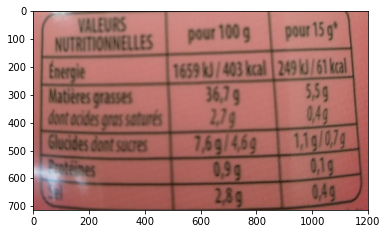

,0,1,2
0,,100 g,pour 15 g*
1,,pour,kcal
2,VALEURS NUTRITIONNELLES,"1659 kJ/403 kcal 36,79","249 k/61 5,59 0,4g"
3,Energie Matieres grasses dont acides gras satures,"2,79 7,6g/4,69 ON B m en","1,1g/0,79 0,19"
4,Glucides dont sucres,"0,99 e","0,49"
5,Penteines,"2,89",


An error has occured
An error has occured
An error has occured


102it [00:00, 9691.88it/s]


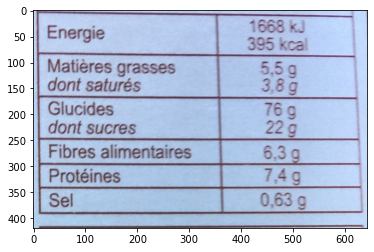

,0,1
0,Energie,1668 kJ 395 kcal
1,Matières grasses dont saturés,"5,5 g 3,8 g"
2,Glucides dont sucres,76 g 22 g
3,Fibres alimentaires,6.3g
4,Protéines,"7,4g"
5,Sel,"0,63 g"


32it [00:00, 2474.88it/s]


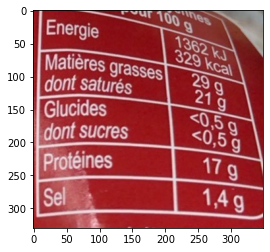

,0,1,2,3
0,Energie,moyennes pour 100 g 1362 329,kJ kcal,
1,Matières dont,grasses saturés,29 g 21 g,
2,Glucides,sucres,"<0,5g <0,5",g
3,dont Sel,Protéines,,"17g 1,4 g"


34it [00:00, 2977.67it/s]


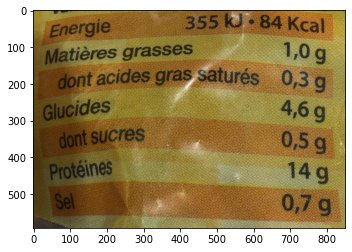

,0,1,2
0,Energie,355 kJ 84,Kcal
1,Matières grasses dont acides gras,"saturés 0,3 1,0",g g
2,Glucides,"4,6",g
3,dont sucres,"0,5",g
4,Protéines,,14 g
5,Sel,"0,7",g


43it [00:00, 3918.97it/s]


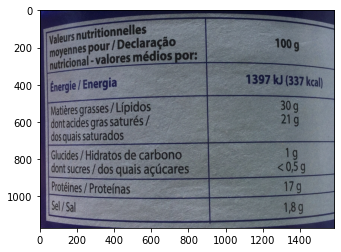

,0,1
0,Valeurs nutritionnelles moyennes pour/ Declaração nutricional-valores médios por:,100 g
1,Energie/Energia,1397 kJ (337 kcall
2,Matières grasses/Lípidos |dont acides gras saturés/ |dos quais saturados,30 g 21g
3,Glucides/Hidratos de carbono dont sucres/dos quais açúcares,"19 <0,5g"
4,Protéines /Proteínas,17 g
5,Sel/Sal,"1,8 g"


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
41it [00:00, 34747.72it/s]


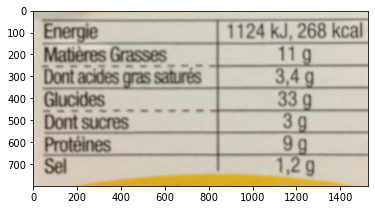

,0
0,


28it [00:00, 3093.88it/s]


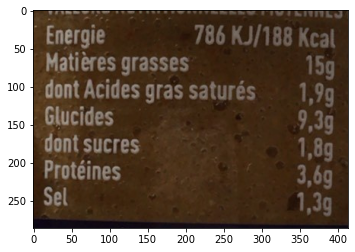

,0,1,2
0,Energie,,786 KJ/188 Kcal
1,dont,Matières grasses Acides gras,"15g 1,9g9 saturés"
2,dont,Glucides sucres Protéines,"9,3g 1,8g 3,69"
3,Sel,,"1,3g"


An error has occured


29it [00:00, 4248.51it/s]


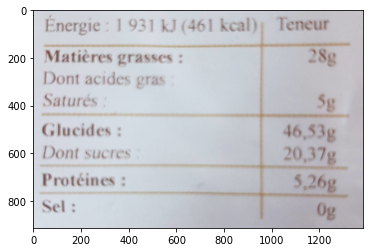

,0,1
0,Energie : 1 931 kJ (461 kcal),Teneur
1,Matières grasses: Dont acides gras Saturés:,28g 5g
2,Glucides: Dont sucres,"46,53g 20,37g"
3,Protéines:,"5,26g"
4,Sel:,0g


58it [00:00, 4778.14it/s]


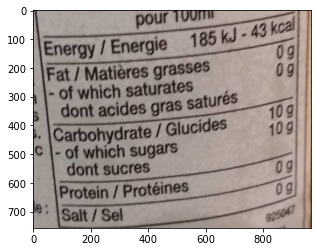

,0,1
0,Energy/Energie,pour 100ml 185 kJ -43 kcal
1,Fat/Matières bien-of which,grasses 0g 0g saturates
2,dont,acides gras saturés
3,,Carbohydrate/Glucides 10 g 10 g
4,of which dont,sugars sucres 0g
5,Protein/Protéines le:,0g
6,Salt/Sel,925047


An error has occured


51it [00:00, 7307.15it/s]


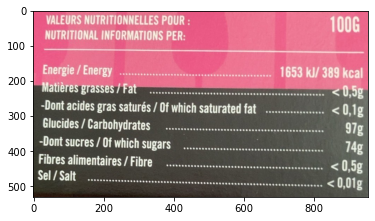

,0,1,2
0,VALEURS NUTRITIONNELLES POUR: NUTRITIONAL INFORMATIONS PER:,,100G
1,Energie / Energy Matières grasses/Fat,1653 kJ/,"389 kcal < 0,5g"
2,-Dont acides gras saturés / Of which Glucides / Carbohydrates -Dont sucres / Of which sugars Fibres alimentaires / Fibre Sel / Salt,saturated fat,"< 0,1g 97g 74g < 0,5g < 0,01g"


An error has occured
An error has occured


74it [00:00, 10772.17it/s]


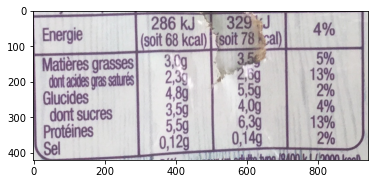

,0,1,2,3
0,Energie,286 kJ (soit 68 kcal)(soit,329 J 78 kcal) 3.5g,4% 5%
1,Matières grasses,"3,0g","2,6g",13%
2,dont acides gras satures Glucides,"2,3g 4,89 435","5,50 4,0g",2% 4%
3,dont sucres,"3,5g","6,30",13%
4,Protéines,"5,5g","0,14g",2%
5,Sel,"0,12g",,kal.


64it [00:00, 3484.36it/s]


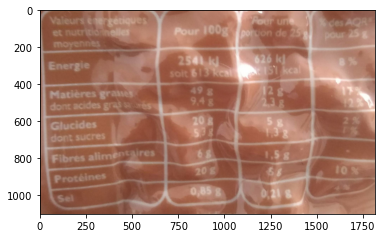

,0,1,2,3
0,Valeurs energetiques et nutritioninelles,Pour 100g,Four une portion de 25,des AQR pour 25 g
1,moyennes Energie,soit 613 kcal 2541 k,626 kl IST kcal,8%
2,Matières grases dont acides gas saes,"49 8 9,48","12g 2,3g 0800",17% 12
3,Glucides dont sucres,20g 538,5 8 1.38,2%
4,Fibres alimentaires,68 20g,"1,5g 68",10%
5,Protéines Sel,"0,85 g","0,21 8",


60it [00:00, 12101.86it/s]


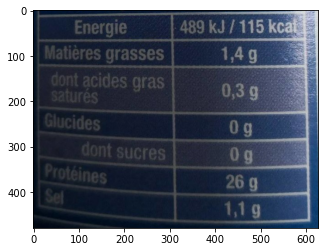

,0,1
0,Energie,489 kJ/115 kcal
1,Matières grasses,"1,4 g"
2,dont acides gras saturés,"0,3 g"
3,Glucides,0g
4,dont sucres,0g
5,Protéines,26 g
6,Sel,"1,1 g"


44it [00:00, 5915.04it/s]


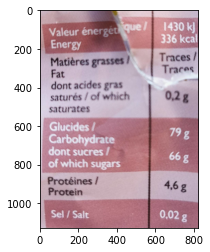

,0,1,2
0,Valeur Energy,énergétque /,1430 k 336 kcal
1,Matières Fat,grasses!,Traces/ Traces
2,dont acides saturés / of saturates,gras which,"0,2g"
3,Glucides / Carbohydrate dont sucres of which,/ sugars,79g 66 8
4,Protéines / Protein,,"4,6 g"
5,Sel / Salt,,"0,02 g"


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
53it [00:00, 53143.23it/s]


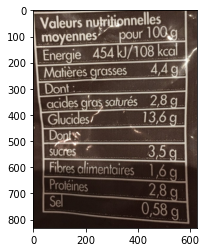

,0
0,


137it [00:00, 19629.01it/s]


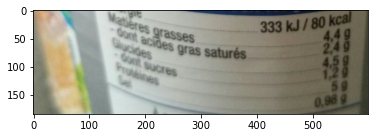

,0,1,2
0,Matieres Gont acides Glucides Gont,grasses 333 kJ/80 gras saturés,"kcal 4,4 g 2,49"
1,sucres,,59
2,Proteines Se,,0.98 9
3,,A,


35it [00:00, 4454.58it/s]


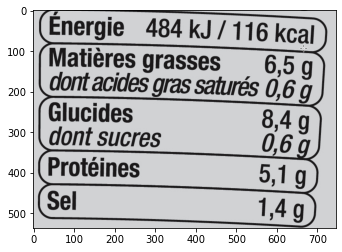

,0,1
0,(Énergie 484 kJ 116,kcal
1,Matières grasses,"6,5 g"
2,dont acides gras saturés,"0,6 g"
3,Glucides dont sucres,"8,4 g 0,6 g"
4,Protéines,"5,1 g"
5,Sel,"1,4 g"


An error has occured


29it [00:00, 5470.91it/s]


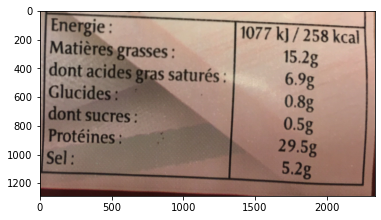

,0,1
0,Energie:,1077 kJ/258 kcal
1,Matières grasses:,15.2g
2,|dont acides gras saturés:,6.9g
3,Glucides:,0.8g
4,dont sucres:,0.5g
5,Protéines:,29.5g
6,Sel:,5.2g


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
45it [00:00, 135203.21it/s]


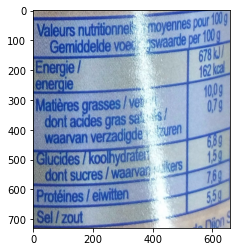

,0,1
0,,


60it [00:00, 5559.54it/s]


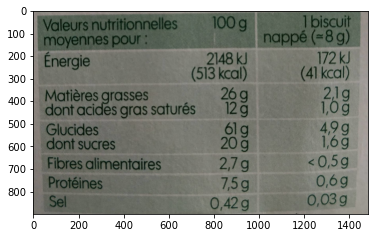

,0,1
0,100 g Valeurs nutritionnelles moyennes pour:,1 biscuit nappé (=8 g)
1,Énergie 2148 kJ (513 kcal),172 kJ (41 kcal)
2,26g 12g Matières grasses dont acides gras saturés,"2,1g 1,0g"
3,61g 20 g Glucides dont sucres,"4,9 g 1,6g"
4,"2,7g Fibres alimentaires","< 0,5g"
5,"7,5g 0,42 g Protéines Sel","0,6g 0,03 g"


63it [00:00, 21056.75it/s]


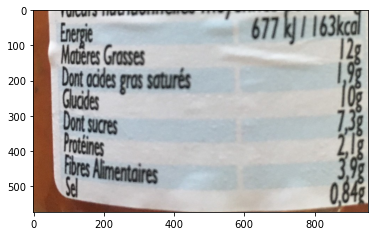

,0,1
0,Valeurs Energie Matieres Grasses,677k1163kcal 12g
1,Dont odes gros saturés Gluades,
2,Dont sucres,
3,Proteines Fibres Alimentaires Sel,


An error has occured


58it [00:00, 7006.21it/s]


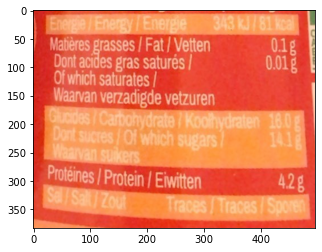

,0,1,2
0,Energie/Energy/Energje,343 kJ/81,kcal
1,Matières grasses/Fat / Vetten Dont acides gras saturés/,,0.01g
2,Of which saturates/ Waarvan verzadigde vetzuren,,
3,Gluaides/Carbohydrate Dont sucres/Of which sugars Waarvan suikers,/Koolhydraten,18.0 g 141
4,Protéines/ Protein/Eiwitten,,428
5,Sal/ Salt/ Zout Traces,/Traces/Sporen,


75it [00:00, 10742.14it/s]


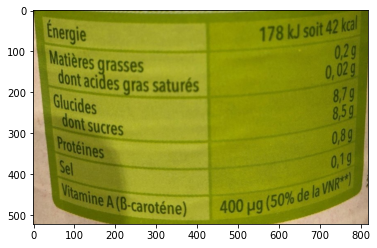

,0,1,2
0,Energie,,"178 kJ soit 42 kcal 0,2g"
1,Matières dont acides,grasses gras saturés,"0,02 g 8,7g"
2,Glucides dont sucres,,"8,5g 0,89 006"
3,Protéines Sel,,"0,19"
4,,,de la VNR**)
5,Vitamine A,(B-caroténe),400 µg (50%


55it [00:00, 9018.25it/s]


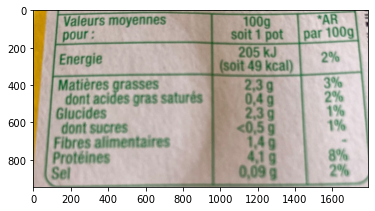

,0,1,2
0,Valeurs moyennes pour:,100g soit 1 pot,*AR par 100g
1,Energie,205 kJ (soit 49 kcal),2%
2,Matières grasses,"2,3g",3%
3,dont acides gras saturés Glucides dont sucres Fibres alimentaires,"0,4g 2,3g <0,5 g 1,4g",2% 1% 1%
4,Protéines Sel,"4,1g 0,09 g",8% 2%


73it [00:00, 3260.44it/s]


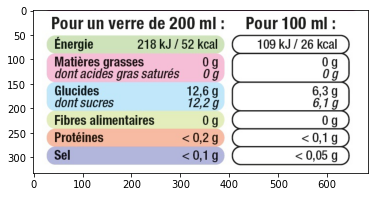

,0,1
0,Pour un verre de 200 ml Énergie 218 kJ / 52 kcal,Pour 100 ml 109 kJ 26 kcal
1,0 g 0 g Matières grasses dont acides gras saturés,0 g 0 g
2,"12,6 g 12,2g Glucides dont sucres","6,3 g 6,1 g"
3,"0 g Fibres alimentaires <0,2 g Protéines <0,1 g Sel","o g <0,1 g <0,05 g"


An error has occured


55it [00:00, 3236.21it/s]


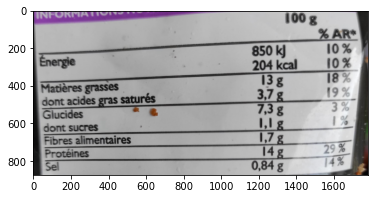

,0,1,2,3
0,INFORMATIONS,,,100 g % AR
1,Énergie,,850 kJ 204 kcal,10% 10%
2,Matières grasses dont acides gras saturés,,"13g 3,7g",18% 19% 3%
3,Glucides dont sucres,,"7,3 g 1,1g",
4,Fibres alimentaires Protéines Sel,,"1,7 g 14g 0,84g",29 % 14%


37it [00:00, 6182.10it/s]


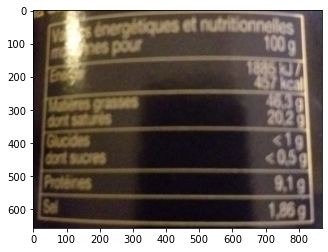

,0,1,2,3
0,m,énergétiques es pour,et,nutritionnelles 100 g
1,,,,1885 KJ7 457kcal
2,Materes dont,grasses satures,,46.3g 202
3,Glucdes dont,sucres,,<19 <0.5g
4,Proteines,,,"9,1g"
5,Sal,,,"1.,86g"


34it [00:00, 2960.54it/s]


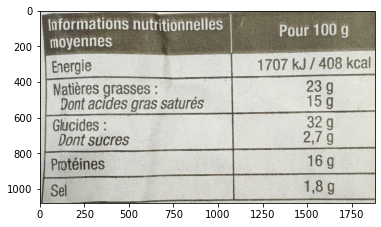

,0,1,2
0,Informations moyennes,nutritionnelles,Pour 100 g
1,Energie,,1707 kJ 408 kcal
2,Natières grasses: Dont acides gras,saturés,23 g 15 g
3,Glucides Dont sucres,,"32 g 2,7 g"
4,Protéines,,16 g
5,Sel,,"1,8 g"


36it [00:00, 3278.51it/s]


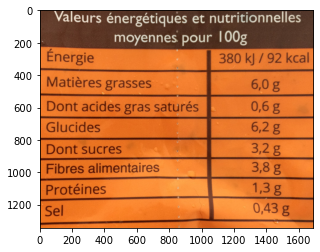

,0,1
0,Valeurs énergétiques et moyennes pour,nutritionnelles 100g
1,Énergie,380 kJ/92 kcal
2,Matières grasses,"6,0 g"
3,Dont acides gras saturés,"0,6g"
4,Glucides,"6,2 g"
5,Dont sucres,"3,2 g"
6,Fibres alimentaires,"3,8 g"
7,Protéines,"1,3g"
8,Sel,"0,43 g"


110it [00:00, 9190.71it/s]


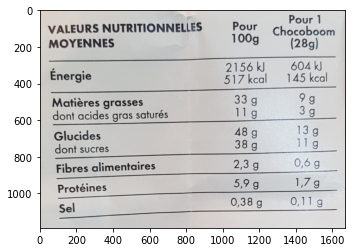

,0,1,2,3
0,,VALEURS NUTRITIONNELLES MOYENNES,Pour 100g,Pour 1 (28g) chocoboom
1,Énergie,,2156 kJ 517 kcal,604 kJ 145 kcal
2,dont,Matières grasses acides gras saturés,33 g 11 g,9 g 3 g
3,dont,Glucides sucres,48 g 38 g,13 g 11 g
4,,Fibres alimentaires,"2,3 g","0,6 g"
5,,Protéines,"5,9 g","1,7 g"
6,Sel,,"0,38 g","0,11 g"


35it [00:00, 8797.83it/s]


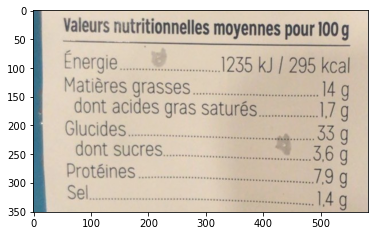

,0,1,2,3
0,Valeurs nutritionnelles,,moyennes,pour 100 g
1,Énergie.,,1235 kJ,/ 295 kcal
2,Matières grasses dont acides,gras,. saturés.,14 g 1.7 g
3,Glucides.,,,.33 g
4,dont sucres..,,,".3,6g"
5,Protéines.. Sel.,,,79 g 1.4 g


An error has occured


24it [00:00, 3988.72it/s]


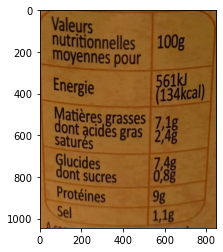

,0,1,2
0,Valeurs nutritionnelles moyennes,pour,100g
1,Energie,,561k 134kcal)
2,Matières dont saturés,grasses acides gras,"7,1g"
3,Glucides dont,sucres,"7,4g 0,8g"
4,Protéines Sel,,"9g 1,1g"


36it [00:00, 3713.14it/s]


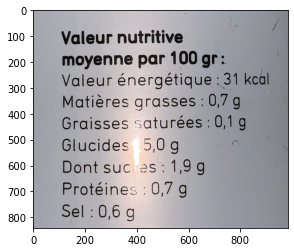

,0,1
0,Valeur nutritive moyenne par,100 gr:
1,Valeur énergétique,: 31 kcal
2,Matières grasses,": 0,7 g"
3,Graisses saturées,": 0,1 g"
4,"Glucides 5,0 g Dont suckes 1,9",g
5,"Protéines : 0,7 Sel : 0,6 g",g


24it [00:00, 12032.43it/s]


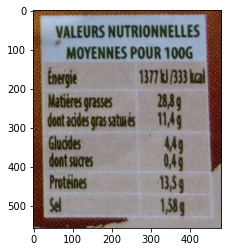

,0,1,2
0,VALEURSNUTRIONNELLES,,
1,MOYENNES,POUR 100G,
2,Energie,,
3,Matieres grasses,,
4,Guddes dontsuaes Protéines,,


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
76it [00:00, 58834.83it/s]


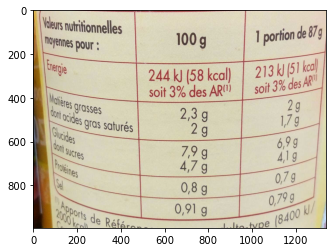

,0,1
0,,


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
98it [00:00, 79782.96it/s]


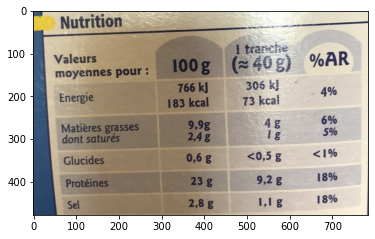

,0
0,


101it [00:00, 11953.63it/s]


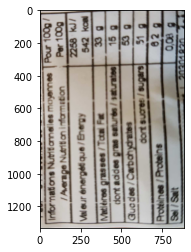

,0,1,2,3
0,100g/ 100g Val eur kJ/ kcal 33 g g 53 g 9 51 82,,,
1,Informations IAverage Nutrit,Nutriiannelles on information,mayennes,Pour Per
2,energéti que,/ Energy,,2258 542
3,Matieres grasses dont addes,/Tatni Fat gras saturés/saturates,,15
4,Qucdes/Carbahydrates Proteines/Proteins,dont,sucres/sugars,"0,08"
5,Sel/Salt,,L,20301830


34it [00:00, 5688.78it/s]


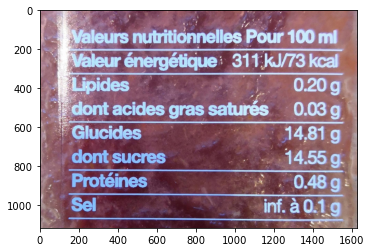

,0,1,2
0,Valeurs nutritionnelles,,Pour 100 ml
1,Valeur énergétique,311,kJ/73 kcal
2,Lipides dont acides gras R,saturés,0.20 g 0.03 g
3,Glucides dont sucres,,"14,81 g 14.55 g."
4,Protéines,,0.48 g
5,Sel,,inf. à 0.1g


115it [00:00, 5763.82it/s]


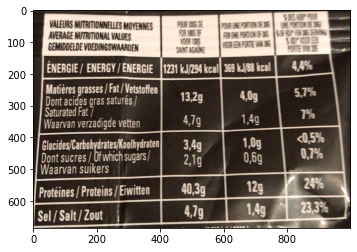

,0,1,2,3
0,VALEURS NUTRITIONNELLES MOYENNES AVERAGE NUTRITIONAL VALUES GEMIDDELDE VOEDINGSWAARDEN,POUR 1006 DE FOR 1006 OF VOOR 1006 SAINT AGAÜNE,POUR UNE PORTION DE 3ENE FOR ONE PORTION OF 306 VOOR EEN PORTIE VAN 3,SDES ABP POUR PORTION DE 5FP FIR EVING SOP OOR GEN PORTE VN E
1,ÉNERGIE / ENERGY / ENERGIE,1231 kJ/294 kcal,369 kJ/88 kcal,"4,4%"
2,Matières grasses / Fat /Vetstoffen Dont acides gras saturés / Saturated Fat7 Waarvan verzadigde vetten,"13,2g 4,7g","4,0g 1,4g","5,7% 7%"
3,Glucides/Carbohydrates/Koolhydraten Dont sucres/Of which sugars/ Waarvan suikers,"3,4g 2,1g","1,0g 0,6g","<0,5% 0,7%"
4,Protéines/Proteins /Eiwitten,"40,3g",12g,24%
5,Sel/Salt/Zout,"4,7g","1,4g","23,3%"


31it [00:00, 3877.13it/s]


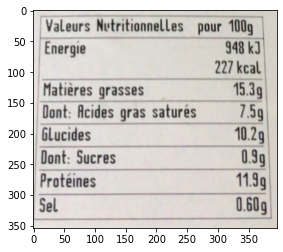

,0,1,2,3
0,Valeurs,Nutritionnelles,pour,100g
1,Energie,,227,948 kJ kcal
2,Matières,grasses,,15.3g
3,Dont: Acides,gras saturés,,7.5g
4,Glucides,,,10.2g
5,Dont: Sucres,,,0.9g
6,Protéines,,,11.9g
7,Sel,,,0.60g


218it [00:00, 9409.88it/s]


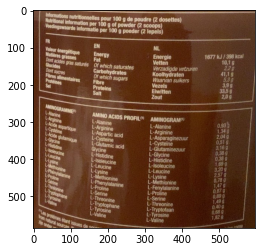

,0,1,2
0,"Informations nutritionnelles Nutritional information Voedingswaarde informatie FR Valeur énergétique Matières grasses Dont acides gras saturés Glucides Dont sucres Fibres alimentaires Proteines Sel sources, de tip onder",pour 100 g de per 100 g of powder (2 per 100 g poeder EN Of which saturates Energy Fat Carbohydrates Of which sugars Fibre Proteins Salt,"poudre (2 dosettes) scoops) (2 lepels) 1677 kJ/ 398 kcal 10,1 g 2,2g 41,1g 5,3g 3,9 g 33,5g 2,0 g NL Energie Vetten Verzadigde vetzuren Koolhydraten Waarvan suikers Vezels Eiwitten Zout"
1,AMINOGRAMME L-Alanine L-Arginine L-Acide aspartique L-Oystéine L-Acide glutamique L-Glycine L-Histidine L-soleucine L-Leucine L-Lysine L-Methionine L-Phénylalanine L-Proline L-Sérine L-Thréonine L-Tryptophane L-yrosine L-Valine tom natural Les proteines étant,AMINO ACIDS L-Alanine L-Arginine L-Aspartic acid L-Cysteine L-Glutamic acid Glycine L-Histidine L-Isoleucine L-Leucine L-Lysine L-Methionine L-Phenylalanine L-Proline L-Serine L-Threonine L-Tryptophane L-Tyrosine L-Valine issues,"PROFIL AMINOGRAM L-Alanine L-Arginine L-Asparaginezuur L-Cysteine L-Giutaminezuur L-Glycine L-Histidine L-Isoleucine L-Leucine L-Lysine L-Methionine L-Fenylalanine L-Proline L-Serine L-Threonine L-Tryptofaan L-Tyrosine L-Valine 0,93 1,34 g 2,04 g 0,51 g 3,16 g 0,38 g 0,38 g 1,69 g 3,20 g 2,57 g 0,78 g 1,47 g 0.87 g 0,89 g 1,49 g 0,40 g 0,68 g 1,82 g come"


33it [00:00, 6676.25it/s]


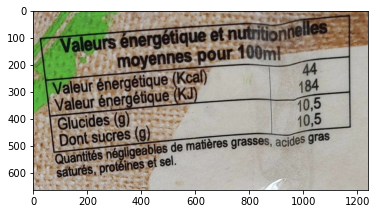

,0,1
0,,
1,Valeurs énergétique et moyennes pour 100ml,nutritionnelles
2,Valeur énergétique (Kcal) Valeur énergétique (KJ),44 184
3,Glucides (g) Dont sucres (g),"10,5 10,5"
4,"Quantités négligeables de matières grasses, saturés, protéines et sel.",acides gras


An error has occured


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
81it [00:00, ?it/s]


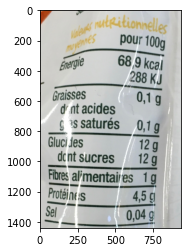

,0
0,


An error has occured


131it [00:00, 14659.14it/s]


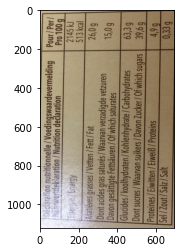

,0,1,2
0,"Pour/ Per/ Dedaration Pro 100 g 2145 kJ 513 kcal 26,0 g Energie Matières Dont acides Davon Dont Sel 15,0g 63,3 g 39,6 g 4,9g 0,33 g",,
1,nutritionnelle Nahnwertdeklaration/Nutrition,/Voedingswaardevermelding declaration,
2,/Energy,,
3,grasses/Vetten /Fett/Fat gras saturés/Waarvan gesättigte Fettsãuren/Of,verzadigde vetzuren which saturates,
4,Glucides/koolhydraten/ sucres/Waarvan suikers / Proteines/Eiwitten/Eiweiß/Proteins,Kohlenhydrate /Carbohydrates Davon Zucker/Of which,suqars
5,/Zout/Salz/Salt,,


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
115it [00:00, 114871.39it/s]


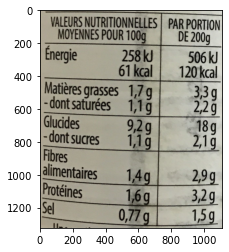

,0
0,


An error has occured
An error has occured


42it [00:00, 4209.64it/s]


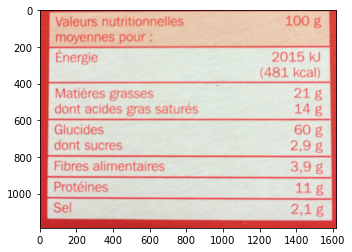

,0,1,2
0,| Valeurs nutritionnelles moyennes pour :,,100 g
1,Énergie,,2015 kJ (481 kcal)
2,Matières grasses dont acides gras saturés,,21 g 14 g
3,Glucides dont sucres,,"60 g 2,9 g"
4,Fibres alimentaires,,"3,9 g"
5,Protéines Sel,,"11 g 2,1 g"


An error has occured
An error has occured
An error has occured


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
58it [00:00, 50335.12it/s]


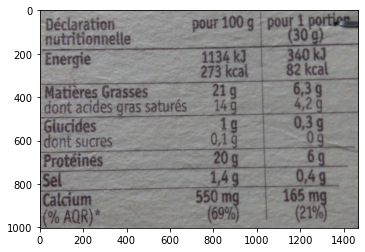

,0,1
0,,
1,,


149it [00:00, 7072.87it/s]


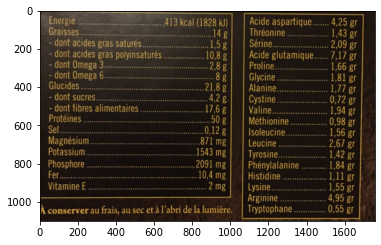

,0,1,2
0,Energie Graisses. - dont acides gras saturés -dont acides gras polyinsaturés dont Omega 3.. -dont Omega 6... Glucides - dont sucres... - dont fibres alimentaires Protéines Sel. Magnésium. Potassium.,"413 kcal (1828 kJ) 14g .1,5 g 10,8g .2,8 g .8g .21,8 g 4,2 g. 17,6g .50g .0,12 g 871 mg 1543 mg .2091 mg","Acide aspartique. 4,25 gr 1,43 gr 2,09 gr Thréonine. .. Sérine.. . Acide glutamique. 7,17 gr 1,66 gr 1,81 gr 1,77 gr 0,72 gr 1,94 gr 0,98 gr 1,56 gr 2,67 gr 1,42 gr 1,84 gr Proline... Glycine Alanine... Cystine. Valine.. Méthionine Isoleucine. Leucine Tyrosine.. Phénylalanine"
1,"Phosphore Fer. Vitamine E A conserver au frais, au sec",".10,4 mg 2 mg et à l’abri de la lumière.","1,11 gr 1,55 gr 4,95 gr 0,55 gr Histidine Lysine.. Arginine Tryptophane."


An error has occured


41it [00:00, 7591.00it/s]


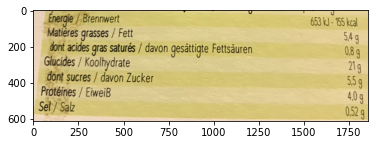

,0,1
0,Energie/ Brennwert Matieres grasses/Fett dont acides gras saturés / davon gesattiqte,"653 kJ- 155 kcal Fettsåuren 549 0,89"
1,Glucides/Koolhydrate,219
2,dont sucres / davon Zucker,55g
3,Protéines/EiweiB,"4,0g"
4,Sel/Salz,"0,52g"


45it [00:00, 5670.19it/s]


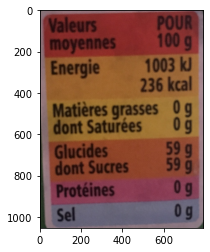

,0,1
0,Valeurs moyennes,POUR 100 g
1,Energie,1003 kJ 236 kcal
2,Matières dont,grasses 0g 0 g Saturées
3,Glucides dont,Sucres 59 g 59 g
4,Protéines,09
5,Sel,0g


31it [00:00, 4444.49it/s]


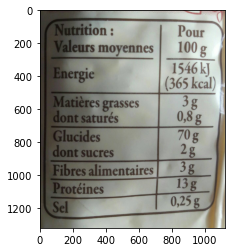

,0,1,2
0,Valeurs,Nutrition: moyennes,Pour 100 g
1,Energie,,1546 kJ (365 kcal)
2,dont,Matières grasses saturés,"3g 0,8g"
3,dont,Glucides sucres,70 g 2g
4,Sel,Fibres alimentaires Protéines,"3g 13g 0,25 g"


40it [00:00, 3631.27it/s]


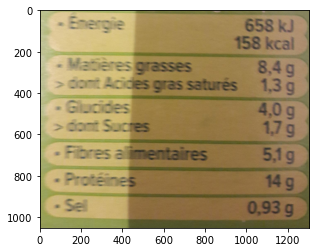

,0,1
0,Energie,658 kJ 158 kcal
1,dont Acides Matières,"8,4 g gras saturés 1,3 g grasses"
2,-Glucides >dont Sucres,"4,0 g 1,7 g"
3,-Fibres,"alimentaires 5,1g"
4,Protéines,14 g
5,-Sell,"0,93 g"


69it [00:00, 3720.98it/s]


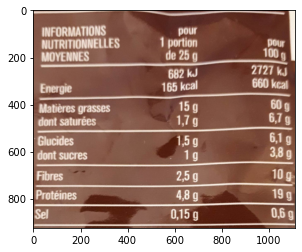

,0,1,2
0,INFORMATIONS NUTRITIONNELLES ΜΟΥΕΝNES,pour 1 portion de 25 g,pour 100 g 2727 kJ
1,Energie,682 kJ 165 kcal,660 kcal
2,Matières dont saturées,"grasses 15 g 1,7 g","60 g 6,7 g"
3,Glucides dont sucres,"1,5 g 1 g","6,1 g 3,8 g"
4,Fibres Protéines,"2,5 g 4,8 g",10 g 19 g
5,Sel,"0,15 g","0,6 g"


An error has occured


102it [00:00, 4263.35it/s]


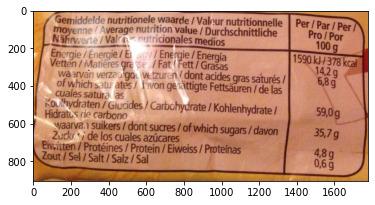

,0,1,2
0,Gemiddelde nutritionele moyenne/Average Nährwerte/Valer,waarde /Valeur nutritionnelle nutrition value / Durchschnittliche utricionales medios,Per /Par/ Per Pro Por 100 g
1,Energie/Énergie/ Vetten/Matières gra se waarvan verzadga of which satu ates/,Ey/Energie / Energía /FatFett/ Grasas vetzuren dont acides gras saturés/ lavon gesattigte Fettsäuren /de las,"1590 kJ/378 kcal 14,2 9 6,8g"
2,cuales satura as Koulhydraten/Giucides/Carbohydrate,/ Kohlenhydrate/,"59,0g"
3,Hidratos de carbono waarvan suikers/ dont,sucres / of which sugars/davon,"35,7 g"
4,Zuck de los cuales Eivitten/ Protéines / Zout/Sel/Salt / Salz/Sal,azúcares Protein/Eiweiss / Proteínas,"4,8g 0,6g"


26it [00:00, 3724.70it/s]


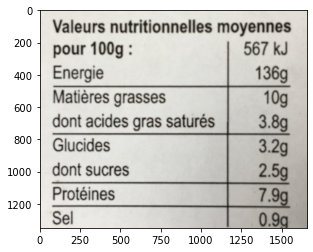

,0,1
0,Valeurs nutritionnelles,moyennes
1,pour 100g Energie,567 kJ 136g
2,Matières grasses,10g
3,dont acides gras saturés,3.8g
4,Glucides dont sucres,3.2g 2.5g
5,Protéines,7.9g
6,Sel,0.9g


An error has occured


28it [00:00, 3506.84it/s]


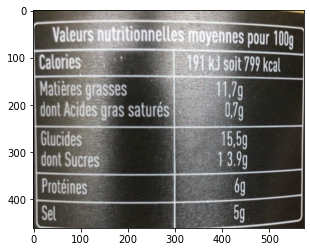

,0,1
0,Valeurs nutritionnelles,moyennes pour 100g
1,Calories,191 kJ soit 799 kcal
2,Matières grasses dont Acides gras saturés,11.7g 0.79
3,Glucides dont Sucres,"15,5g 13.9g"
4,Protéines,6g
5,Sel,5g


93it [00:00, 4440.39it/s]


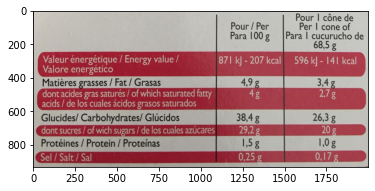

,0,1,2
0,,Pour/ Per Para 100 g,"Pour I cône de Per I cone of Para I cucurucho de 68,5 g"
1,Valeur énergétique / Energy value/ Valore energético,"871 kJ -207 kcal 4,9 g bo","596 k- 141 kcal 3,4 g"
2,Matières grasses/Fat/Grasas dont acides gras saturés / of which saturated fatty acids/ de los cuales ácidos grasos saturados Glúcidos,"4 g 38,4 g bo","2,7g 26,3 g"
3,Glucides/ Carbohydrates/ dont sucres/of wich sugars/de los cuales azúcares Protéines / Protein / Proteínas Sel/Salt/Sal,"29,2g 1,5g 0,25g","20g 1,0g 0,17 g"


46it [00:00, 4208.94it/s]


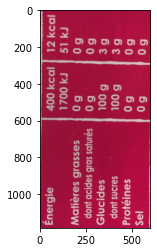

,0,1
0,12 kcal Énergie Matières dont acides Glucides dont Protéines Sel 51 kJ 0 g 0 g 3 g 3 g 0 g 0 g,400 kcal kJ
1,,1700
2,grasses gras saturés sucres,0 g 0 g 100 g 100 g o g 0 g
3,,


An error has occured


39it [00:00, 3910.54it/s]


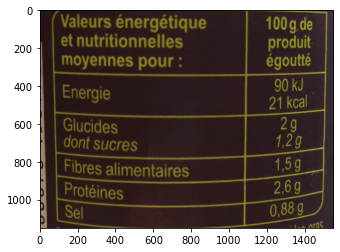

,0,1
0,Valeurs énergétique et nutritionnelles,100g de produit
1,moyennes pour:,égoutté
2,Energie,90 kJ 21 kcal
3,Glucides dont sucres,"2g 1,2 g"
4,Fibres alimentaires,"1,5g"
5,Proteines Sel,"2,6g 0,88 g"


An error has occured


44it [00:00, 3677.23it/s]


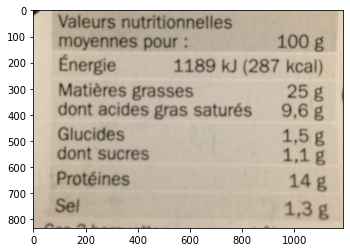

,0,1,2
0,Valeurs,nutritionnelles,
1,moyennes,pour:,100 g
2,Énergie,1189 kJ (287,kcal)
3,Matières dont acides,grasses gras saturés,"25 g 9,6 g"
4,Glucides dont sucres,,"1,5 g 1,1 g"
5,Protéines,,14 g
6,Sel,,"1,3 g"


212it [00:00, 4370.55it/s]


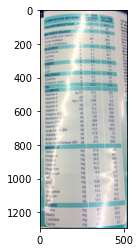

,0,1,2
0,Paur COMPOSITION MOYENNE VALEUR ENERGETIQUE keal MATIERES GRA8BES Dont acides gras saturés Acide linoléique Acide linolenique CLUCIDES Dont sucres Lactose Amidon FIBRES FOS GOS PROTEINES,"100m reconatitues 15,6 271 06 3.1 1.3 de 81 7,4 4.2 4.1 2.0 0,1 0,7 1,4","Pour 1000 poudr Lait de et aliment en bas 2011 An 233 9.8 3600 600 648 31,4 30.7 14. 5.9 0.6 63 10,0 VeTWe ait a Veclw"
1,Caseines Proteines solubles SEL VITAMINES Vitamine A Vitamine D Vitamine E Vitamine K Vitamine C Thiamine (B1) Riboflavine (B2) Niacine (PP) Vitamine B6 Acide folique (B9) Vitamine B12 Biotine ( ER Pg mg a-TE mg Acide pantothenique (B5) u MINERAUX,"0,5 0,8 0.05 70,2 1,0 0.88 5,4 12,2 74,3 135 689 60,8 13,5 0.16 2,0 473","ém 6,0 0,40 chiorue Aheng decok 520 7.7 6,5 40,0 90,0 550 1000 5100 450 100,0 1,2 15,0 3500 160"
2,Sodium Potassium Chlorure Calcium Phosphore Magnesium Fer Zinc mg mg mg mg mg mg mg mg,"21,6 64,8 54,0 81.0 50,0 6.8 1,1 0,65","480 400 600 370 50,0 8,3 4,8"
3,Cuivre Manganèse Selenium lode AUTRES,"44,6 13,5 2,0 10,8","330 100 15,0 80,0"
4,Choline Inosito L-carnitine Taurine mg mg mg mg,"8,1 41 1,5 0.72","60,0 30,0 11,0 5,3"


An error has occured


53it [00:00, 3329.61it/s]


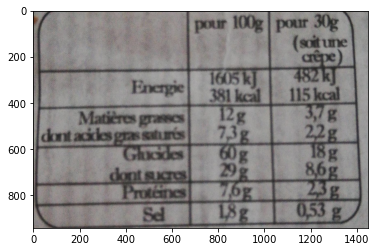

,0,1,2
0,pour 30g,100g,pour (soit une cepe) kJ
1,,1605 kJ 381 kcal,"482 115kcal 3,7g"
2,Energie,12g be,22g
3,Matières grascs dont acicles grassaturés Gluddes,"7,3g 60g 29g bd be ad 382",18g 86g 23g
4,dont sucres Proteines,18g bo,"0,53 g"
5,Sel,,


32it [00:00, 4558.87it/s]


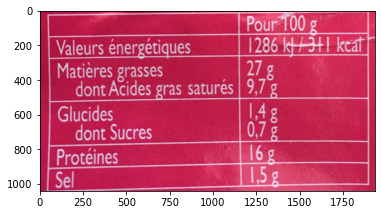

,0,1
0,,Pour T00 g
1,Valeurs énergétiques,1286 kt1311 kcat
2,Matières grasses dont Acides gras saturés,"27 g 9,7g"
3,Glucides dont Sucres,"1.4g 0,7g"
4,Protéines,16 g
5,Sel,"1,5g"


An error has occured
An error has occured


41it [00:00, 4590.06it/s]


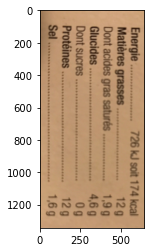

,0,1,2
0,"Energie.. Matières Dont Glucides Dont Protéines Sel 174 kcal 12 g 1,9 g 4,6 g 0g 12 g 1,6 g ***",grasses 726,kJ soit
1,acides **,gras saturés,ee.ccce
2,sucres ********,,eecce cnnenceee


40it [00:00, 4459.77it/s]


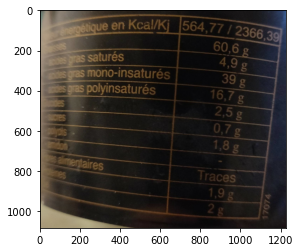

,0,1
0,Serergetique en Kcal/Ki Sesses,"564,77 /2366,39 60,6 g"
1,es gras saturés,"4,9 g"
2,des gras mono-insaturés,39
3,es gras polyinsaturés,"16,7 g"
4,pes,"2,5 g"
5,CTes,"0,7 g"
6,phyols idom,"1,8 g"
7,s alimentaires nes,Traces
8,,"1,9g 2 g 17074"


66it [00:00, 6011.51it/s]


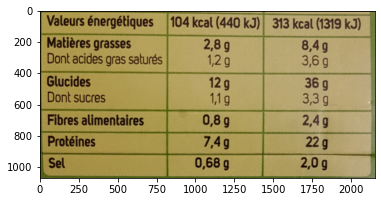

,0,1,2
0,Valeurs énergétiques,104 kcal (440 kJ),313 kcal (1319 kJ)
1,Matières grasses Dont acides gras saturés,"2,8g 1,2 g","8,4g 3,6g"
2,Glucides Dont sucres,"12g 1,1 g","36 g 3,3g"
3,Fibres alimentaires,"0,8g","2,4g"
4,Protéines,"7,4 g",22 g
5,Sel,"0,68 g","2,0g"


An error has occured
An error has occured
An error has occured
An error has occured


71it [00:00, 11861.53it/s]


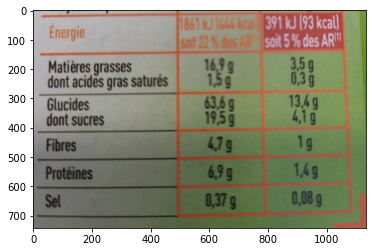

,0,1,2
0,Energie,1861 kJ(444 kcall Sait 22% des AR,391 kJ (93 kcal) soit 5% des AR
1,Matières grasses dont acides gras saturés,"16.9g 1,5g","3,5g 0,3 g"
2,Glucides dont sucres,"63,6g 19,5 9","13,4 g 4,19"
3,Fibres,"4,7 g",1g
4,Proteines,"6,99","1,4g"
5,Sel,"0,37 g","0,08 9"


An error has occured
An error has occured
An error has occured


30it [00:00, 3320.38it/s]


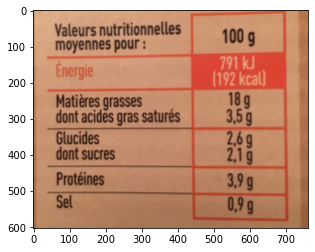

,0,1
0,Valeurs nutritionnelles moyennes pour:,100 g
1,Energie,791 kJ (192 kcal]
2,Matières grasses dont acides gras saturés,"18g 3,5g"
3,Glucides dont sucres,"2,69 2,1 g"
4,Protéines,"3,9 g"
5,Sel,"0,9"


87it [00:00, 5717.62it/s]


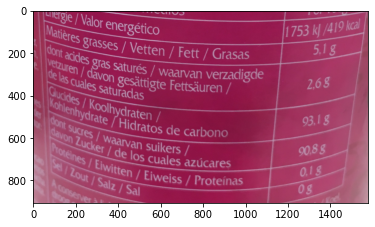

,0,1
0,mediOS Energie/ Valor energético Cconserver à oog,1753 kl /419 kcal 5.1g
1,Matières grasses/Vetten / Fett/Grasas,"2,6g"
2,dont acides gras saturés/waarvan verzadigde vetzuren | dlavon gesättigte Fettsäuren / de las cuales saturadas,"93,1g"
3,Glucides/Koolhydraten/ Kohlenhydrate /Hidratos de carbono,"90,8g"
4,9ont sucres/waarvan suikers davon Zucker/ de los cuales azúcares,O.18
5,Proteines/Eiwitten/ Eiweiss/Proteínas Se/ Zout/Salz/ Sal,icdite/Koel


74it [00:00, 6203.97it/s]


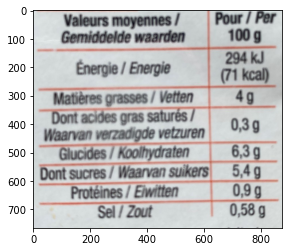

,0,1,2
0,Valeurs Gemiddelde,moyennes / waarden,Pour / Per 100 g
1,Énergie,/ Energie,294 kJ (71 kcal)
2,Matières,grasses / Vetten,4 g
3,Dont acides Waarvan,gras saturés / verzadigde vetzuren,"0,3 g"
4,,Glucides/Koolhydraten,"6,3 g"
5,Dont sucres /,Waarvan suikers,"5,4 g"
6,Protéines,/ Eiwitten,"0,9 g"
7,Sel,/ Zout,"0,58 g"


66it [00:00, 2762.08it/s]


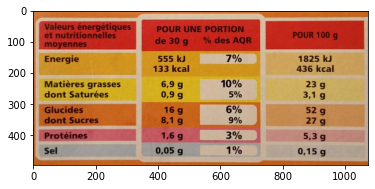

,0,1,2,3
0,Valeurs énergétiques et nutritionnelles moyennes,POUR UNE de 30 g,PORTION % des AQR,POUR 100 g
1,Energie,555 kJ 133 kcal,7%,1825 kJ 436 kcal
2,Matières grasses dont Saturées,"6,9 g 0,9 g",10% 5%,"23 g 3,1 g"
3,Glucides dont Sucres,"16 g 8,1 g",6% 9%,52 g 27 g
4,Protéines,"1,6 g",3%,"5,3 g"
5,Sel,"0,05 g",1%,"0,15 g"


C:\Users\sadok.guermazi\AppData\Local\Continuum\anaconda3\envs\tf_gpu\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
65it [00:00, ?it/s]


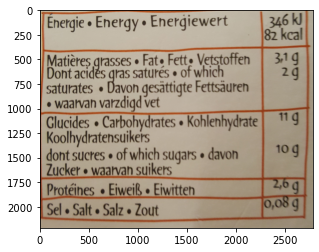

,0,1
0,,
1,,


47it [00:00, 4970.18it/s]


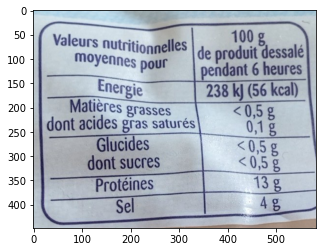

,0,1,2
0,Valeurs,nutritionnelles de,100 g produit dessale
1,,moyennes pour,pendant 6 heures
2,,Energie,238 kJ (56 kcal)
3,Matières dont,grasses acides gras saturés,"<0,5 g 0,1 g"
4,,Glucides dont sucres,"<0,5 g < 0,5 g"
5,,Protéines Sel,13 g 4g


An error has occured


63it [00:00, 6344.33it/s]


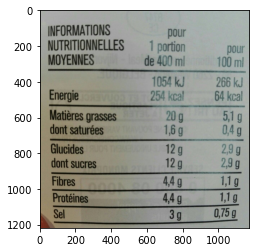

,0,1,2
0,INFORMATIONS NUTRITIONNELLES MOYENNES,pour 1 portion de 400 ml,pour 100 ml
1,Energie,1054 kJ 254 kcal,266 kJ 64 kcal
2,Matières grasses dont saturées,"20 g 1,6 g","5,1 g 0,4 g"
3,Glucides dont sucres,12 g 12 g,"2,9 g 2,9 g"
4,Fibres Protéines Sel,"4,4 g 4,4g 3 g","1,1 g 1,1 g 0,75 g"


In [10]:
for product_barcode in df.barcode.values[1:]:
    try:
        image_path = df[df.barcode==product_barcode].source_image.iloc[0]
        #Get table bbx
        crop = convert_to_dict(df[df.barcode==product_barcode]['data'].iloc[0])['annotation']['crop']
        table_bbx = Rectangle(crop['start']['x'],crop['start']['y'],crop['end']['x'],crop['end']['y'])
        #image_url
        url = 'https://static.openfoodfacts.org/images/products'+image_path
        off_image, table = predict(url,table_bbx)
        plt.imshow(off_image.cropped_image)
        plt.show()
        display(pd.DataFrame(table))
        
    except:
        print("An error has occured")